<a href="https://colab.research.google.com/github/Stamby22/DSCZ9_final_project/blob/main/Copy_of_Project_SDA_Butterflies_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project SDA Butterflies classification


*   download data
*   gathering requirements
*   data visualization
*   data processing




## About Dataset

We use the dataset https://www.kaggle.com/datasets/chris565/butterflies-austria-20/code


This is the butterflies images Dataset.In this dataset there are 20 different species of butterflies living in Austria.

The dataset consits of over 7000 butterflies and every class consists of 300-500 species.

This Dataset consists of folder as butterflies and species csv file.

The butterflies folder further contains two folder: Train folder and val folder.

The Train and Val Folder further contains several folders of images.

There are 20 Number of files in Training Folder and 20 Number of Files in the Validation Folder.

## Imports

In [74]:
import os
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

import tensorflow as tf
#from tensorflow.keras.models import Sequential
#from keras.layers import Dense
#from keras.utils import to_categorical
#from keras.regularizers import l1, l2

In [75]:
from PIL import Image

In [76]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

## Load data

### From Google Drive

In [1]:
# propojit svůj Disk Google
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
# Spustit pouze poprvé !!
#!unzip /content/drive/MyDrive/Datasets/Butterflies_Austria_5_20.zip -d /content/Datasets
#!unzip /content/drive/MyDrive/Datasets/Butterflies_Austria_7000.zip -d /content/Datasets

In [6]:
dataset_dir = "/content/Datasets/"
#dataset_dir = "/content/Datasets/Butterflies_Austria_5_20/"
train_dir = os.path.join(dataset_dir, "butterflies", "train")
val_dir = os.path.join(dataset_dir, "butterflies", "val")

# Define the path to your dataset directory
# dataset_path = '/kaggle/input/butterflies-austria-20'

### From Local Directory

In [77]:
current_working_directory = os.getcwd()
print(current_working_directory)

c:\Users\p.kubes\Desktop\pkubes\DataScienceCZ9\pythonProjects\Butterflies_Austria_CV


In [78]:
os.listdir()

['.git',
 '.gitignore',
 '.venv',
 'Butterflies_Austria',
 'Butterflies_Austria_SDA_final_project.ipynb',
 'README.md',
 'requirements.txt']

In [79]:
dataset_dir = "Butterflies_Austria"
dataset_dir = os.path.join(current_working_directory, dataset_dir)

In [80]:
os.listdir(dataset_dir)

['butterflies', 'species.csv', 'species_cname.csv']

In [81]:
train_dir = os.path.join(dataset_dir, "butterflies", "train")
val_dir = os.path.join(dataset_dir, "butterflies", "val")

## Zobrazení Species.csv

In [82]:
df = pd.read_csv(os.path.join(dataset_dir, "species.csv"))
df#.head()

,num,abk,gname,latin
0,1,ad,Admiral,Vanessa Atalanta
1,2,ap,Apollo,Parnassius Apollo
2,3,af,Aurora,Anthocharis Cardamines
3,4,bl,Blaeuling,Lycaenidae
4,5,cf,C-Falter,Polygonia C-album
5,6,df,Distelfalter,Vanessa Cardui
6,7,po,Postilion,Colias Myrmidone
7,8,km,Kaisermantel,Argynnis Paphia
8,9,kf,kleiner Fuchs,Aglais Urticae
9,10,kw,Kohlweissling,Pieris Rapae


In [83]:
dfcz = pd.read_csv(os.path.join(dataset_dir, "species_cname.csv"), encoding="cp1250")
dfcz#.head()

,num,abk,gname,latin,cname
0,1,ad,Admiral,Vanessa Atalanta,Babočka admirál
1,2,ap,Apollo,Parnassius Apollo,Jasoň červenooký
2,3,af,Aurora,Anthocharis Cardamines,Bělásek řeřichový
3,4,bl,Blaeuling,Lycaenidae,Modráskovití
4,5,cf,C-Falter,Polygonia C-album,Babočka bílé C
5,6,df,Distelfalter,Vanessa Cardui,Babočka bodláková
6,7,po,Postilion,Colias Myrmidone,Žluťásek barvoměnný
7,8,km,Kaisermantel,Argynnis Paphia,Perleťovec stříbropásek
8,9,kf,kleiner Fuchs,Aglais Urticae,Babočka kopřivová
9,10,kw,Kohlweissling,Pieris Rapae,Bělásek řepový


In [84]:
num_train_files = len(os.listdir(train_dir))
print(f"Number of files in the 'train' folder: {num_train_files}")

num_val_files = len(os.listdir(val_dir))
print(f"Number of files in the 'val' folder: {num_val_files}")

Number of files in the 'train' folder: 20
Number of files in the 'val' folder: 20


In [86]:
# Count images per folder in training data
def count_images_per_folder(data_path):
    folders = os.listdir(data_path)
    folders.sort()
    folder_counts = {}
    for folder in folders:
        folder_path = os.path.join(data_path, folder)
        if os.path.isdir(folder_path):
            num_images = len(os.listdir(folder_path))
            folder_counts[folder] = num_images
    return folder_counts

# Vypíše počet obrázků v jednotlivých složkách train_dir
train_folder_counts = count_images_per_folder(train_dir)
print("Number of images in each folder of Training Data:")
for folder, count in train_folder_counts.items():
    print(f"{folder}: {count} images, Druh: {dfcz[dfcz['abk'] == folder]['cname'].values[0]}")

Number of images in each folder of Training Data:
ad: 462 images, Druh: Babočka admirál
af: 438 images, Druh: Bělásek řeřichový
ap: 296 images, Druh: Jasoň červenooký
bl: 402 images, Druh: Modráskovití
cf: 384 images, Druh: Babočka bílé C
df: 313 images, Druh: Babočka bodláková
dfa: 157 images, Druh: Ohniváček celíkový
kf: 257 images, Druh: Babočka kopřivová
km: 382 images, Druh: Perleťovec stříbropásek
kw: 357 images, Druh: Bělásek řepový
oa: 396 images, Druh: Okáč luční
ol: 221 images, Druh: Pestrokřídlec podražcový
po: 274 images, Druh: Žluťásek barvoměnný
sb: 398 images, Druh: Okáč bojínkový
sf: 338 images, Druh: Batolec duhový
sfa: 285 images, Druh: Otakárek ovocný
ss: 239 images, Druh: Otakárek fenyklový
tf: 259 images, Druh: Babočka paví oko
tm: 147 images, Druh: Babočka osiková
zf: 219 images, Druh: Žluťásek řešetlákový


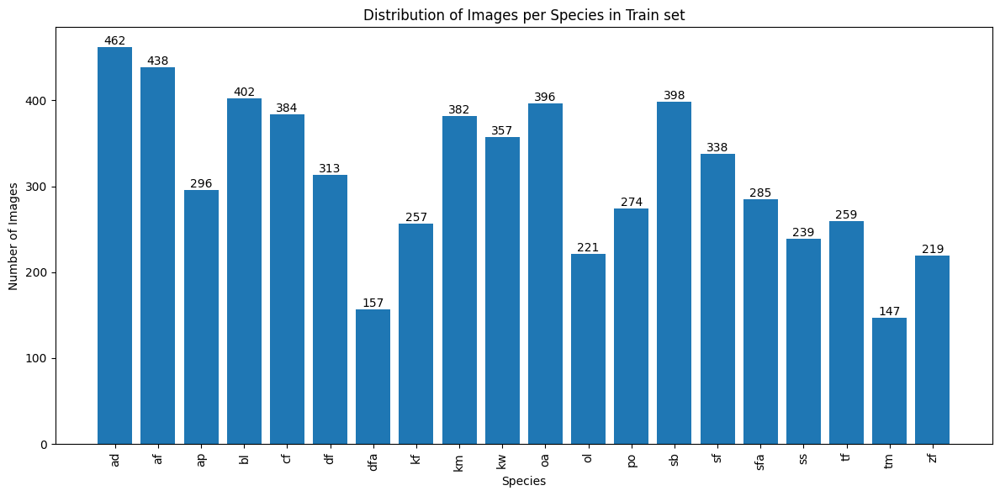

In [105]:
# Barplot of number of images for each species - train set

# Get the counts of images in each folder
train_folder_counts = count_images_per_folder(train_dir)

# Extract folder names and counts
folders = list(train_folder_counts.keys())
counts = list(train_folder_counts.values())

# Create the bar plot
plt.figure(figsize=(12, 6))
plt.bar(folders, counts)
plt.xlabel("Species")
plt.ylabel("Number of Images")
plt.title("Distribution of Images per Species in Train set")
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

for i, v in enumerate(counts):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [87]:
# Vypíše počet obrázků v jednotlivých složkách val_dir
train_folder_counts = count_images_per_folder(val_dir)
print("\nNumber of images in each folder of Validation Data:")
for folder, count in train_folder_counts.items():
    print(f"{folder}: {count} images, Druh: {dfcz[dfcz['abk'] == folder]['cname'].values[0]}")


Number of images in each folder of Validation Data:
ad: 12 images, Druh: Babočka admirál
af: 14 images, Druh: Bělásek řeřichový
ap: 13 images, Druh: Jasoň červenooký
bl: 13 images, Druh: Modráskovití
cf: 12 images, Druh: Babočka bílé C
df: 19 images, Druh: Babočka bodláková
dfa: 14 images, Druh: Ohniváček celíkový
kf: 12 images, Druh: Babočka kopřivová
km: 13 images, Druh: Perleťovec stříbropásek
kw: 11 images, Druh: Bělásek řepový
oa: 11 images, Druh: Okáč luční
ol: 23 images, Druh: Pestrokřídlec podražcový
po: 12 images, Druh: Žluťásek barvoměnný
sb: 12 images, Druh: Okáč bojínkový
sf: 11 images, Druh: Batolec duhový
sfa: 12 images, Druh: Otakárek ovocný
ss: 3 images, Druh: Otakárek fenyklový
tf: 14 images, Druh: Babočka paví oko
tm: 13 images, Druh: Babočka osiková
zf: 13 images, Druh: Žluťásek řešetlákový


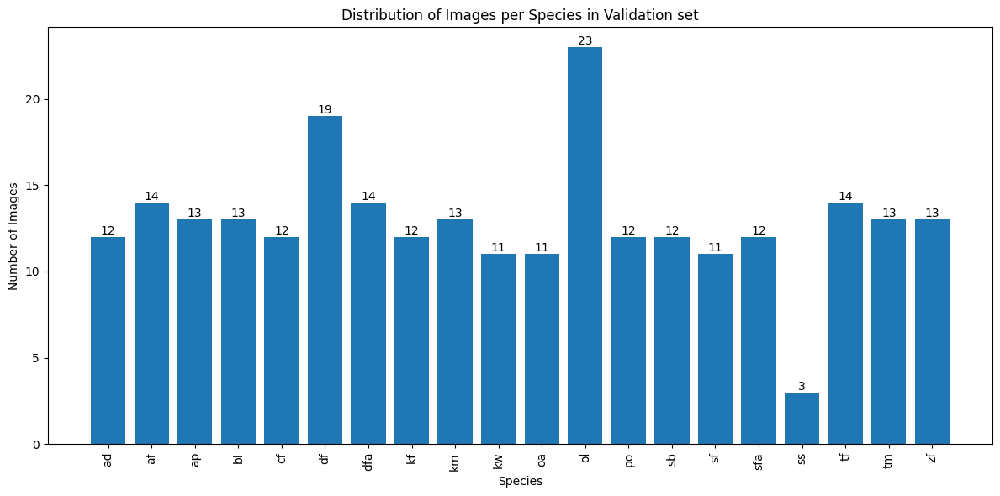

In [106]:
# Barplot of number of images for each species - validation set

# Get the counts of images in each folder
train_folder_counts = count_images_per_folder(val_dir)

# Extract folder names and counts
folders = list(train_folder_counts.keys())
counts = list(train_folder_counts.values())

# Create the bar plot
plt.figure(figsize=(12, 6))
plt.bar(folders, counts)
plt.xlabel("Species")
plt.ylabel("Number of Images")
plt.title("Distribution of Images per Species in Validation set")
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

for i, v in enumerate(counts):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.show()

## Show images

In [ ]:
# Functions definitons

In [61]:
def display_image(image_path, title=""):
    image = Image.open(image_path)
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.title(title)
    plt.show()

def display_images_with_titles(image_paths, titles):
    fig, ax = plt.subplots(5, 5, figsize=(30, 25))
    for i, image_path in enumerate(image_paths):
        row = i // 5
        col = i % 5
        image = Image.open(image_path)
        image = image.resize(size=(140, 140))
        ax[row, col].imshow(image)
        ax[row, col].axis('off')
        ax[row, col].set_title(titles[i])
    plt.tight_layout()
    plt.show()

def display_images_with_titles_II(image_paths, titles):
    """
    Displays multiple images with titles in a single plot.

    Args:
        image_paths: A list of paths to the images.
        titles: A list of titles corresponding to the images.
    """
    num_images = len(image_paths)
    fig, axes = plt.subplots(4, 5, figsize=(15, 5))  # Adjust figsize as needed

    for i in range(num_images):
        row = i // 5
        col = i % 5
        image = plt.imread(image_paths[i])
        axes[row, col].imshow(image)
        axes[row, col].set_title(titles[i])
        axes[row, col].axis('off')  # Remove axis labels

    plt.tight_layout()
    plt.show()

def display_images_with_titles_III(image_paths, titles):
    fig, ax = plt.subplots(2, 5, figsize=(20, 10))
    for i, image_path in enumerate(image_paths):
        row = i // 5
        col = i % 5
        image = Image.open(image_path)
        ax[row, col].imshow(image)
        ax[row, col].axis('off')
        ax[row, col].set_title(titles[i])
    plt.tight_layout()
    plt.show()

Number of images displayed: prvních 10


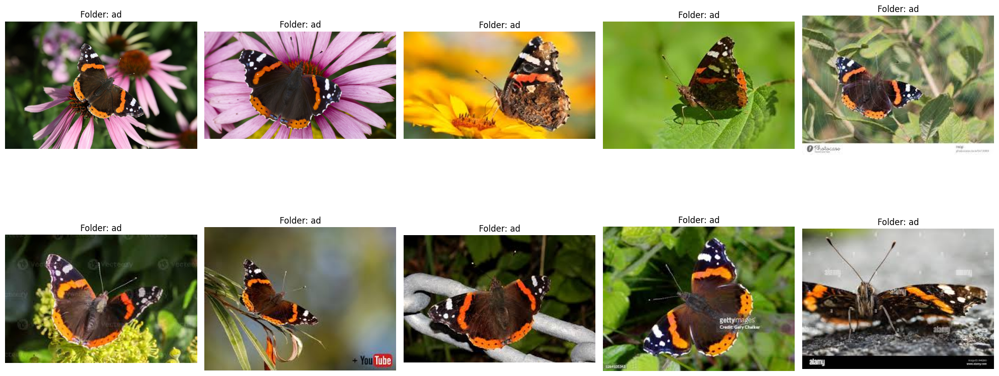

In [49]:
# Zobrazení prvních 10 obrázků prvního druhu

train_folders = os.listdir(train_dir)
train_folders.sort()
train_images_displayed = 0
train_image_paths = []
train_image_titles = []
for folder in train_folders:
    folder_path = os.path.join(train_dir, folder)
    image_files = os.listdir(folder_path)
    for i, image_file in enumerate(image_files):
        if train_images_displayed < 10:
            image_path = os.path.join(folder_path, image_file)
            train_image_paths.append(image_path)
            train_image_titles.append(f"Folder: {folder}")
            train_images_displayed += 1
        else:
            break

print(f"Number of images displayed: prvních {train_images_displayed}")
display_images_with_titles_III(train_image_paths, train_image_titles)

Number of images displayed: prvních 24
['/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-001.jpg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-002.jpg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-003.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-004.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-006.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-007.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-008.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-009.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-010.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-011.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-012.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ad/ad-013.jpeg', '/content/Data

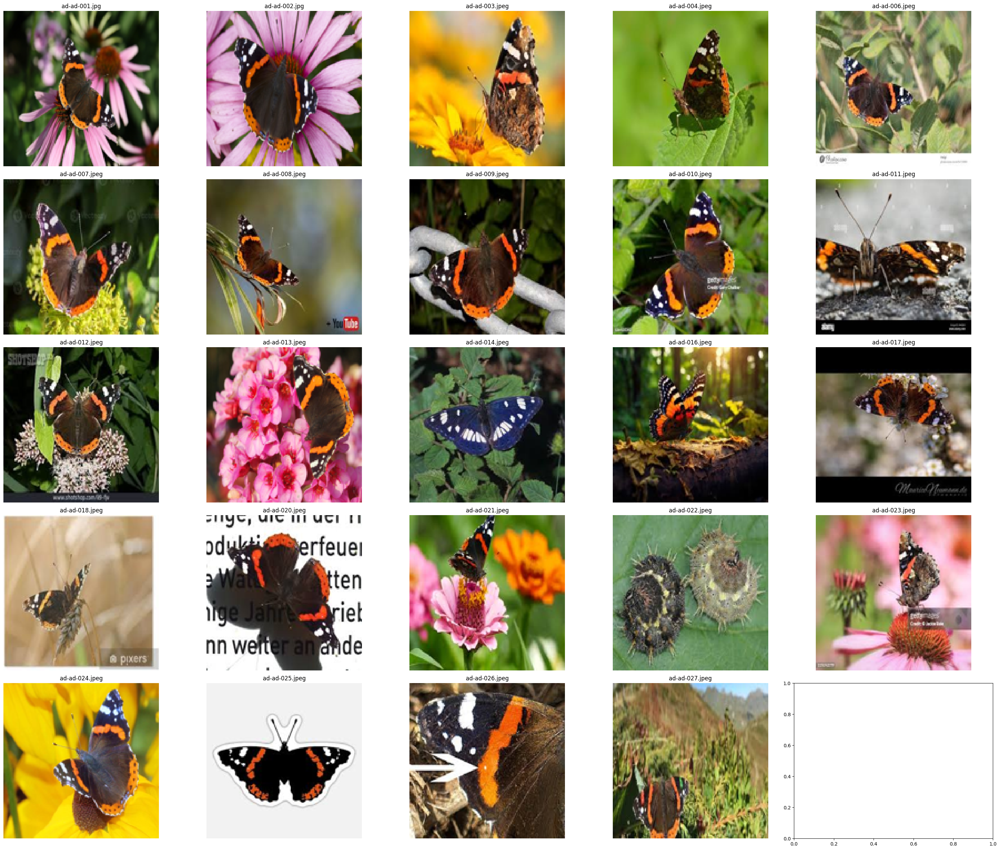

Number of images displayed: prvních 24
['/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-001.jpg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-002.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-003.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-004.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-005.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-006.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-007.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-008.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-009.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-011.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-012.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/af/af-013.jpeg', '/content/Dat

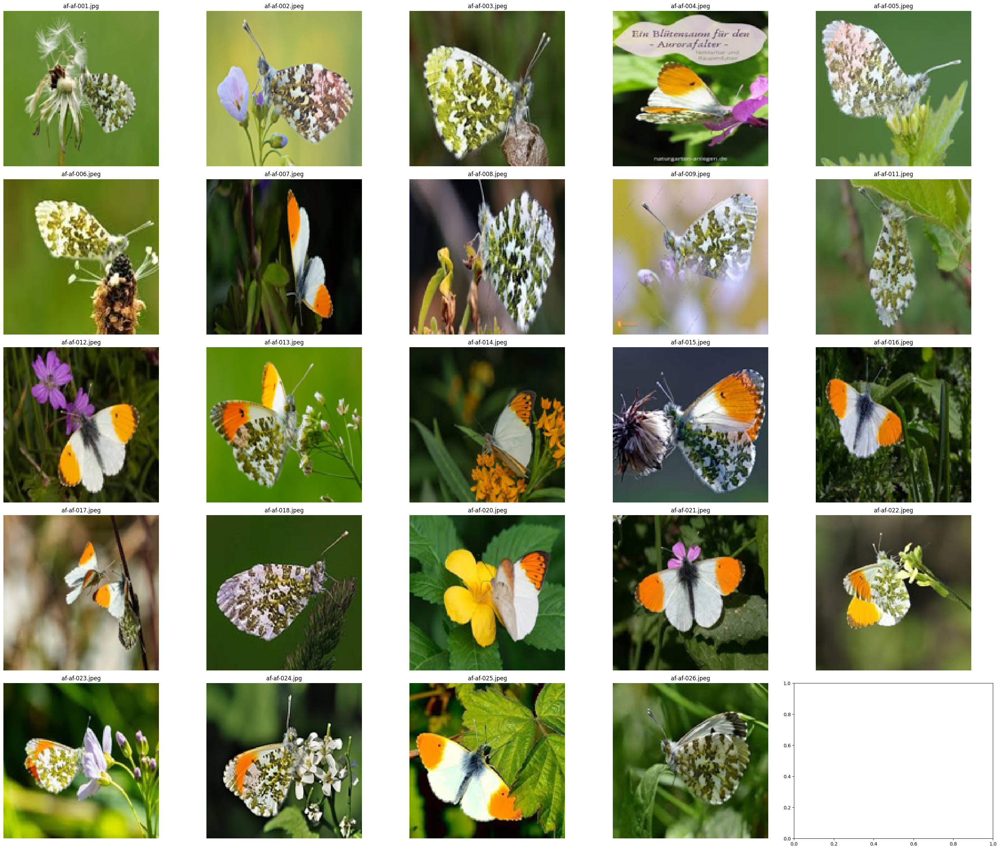

Number of images displayed: prvních 24
['/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-001.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-002.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-003.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-004.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-005.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-006.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-007.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-009.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-010.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-011.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-012.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/ap/ap-013.jpg', '/content/Dat

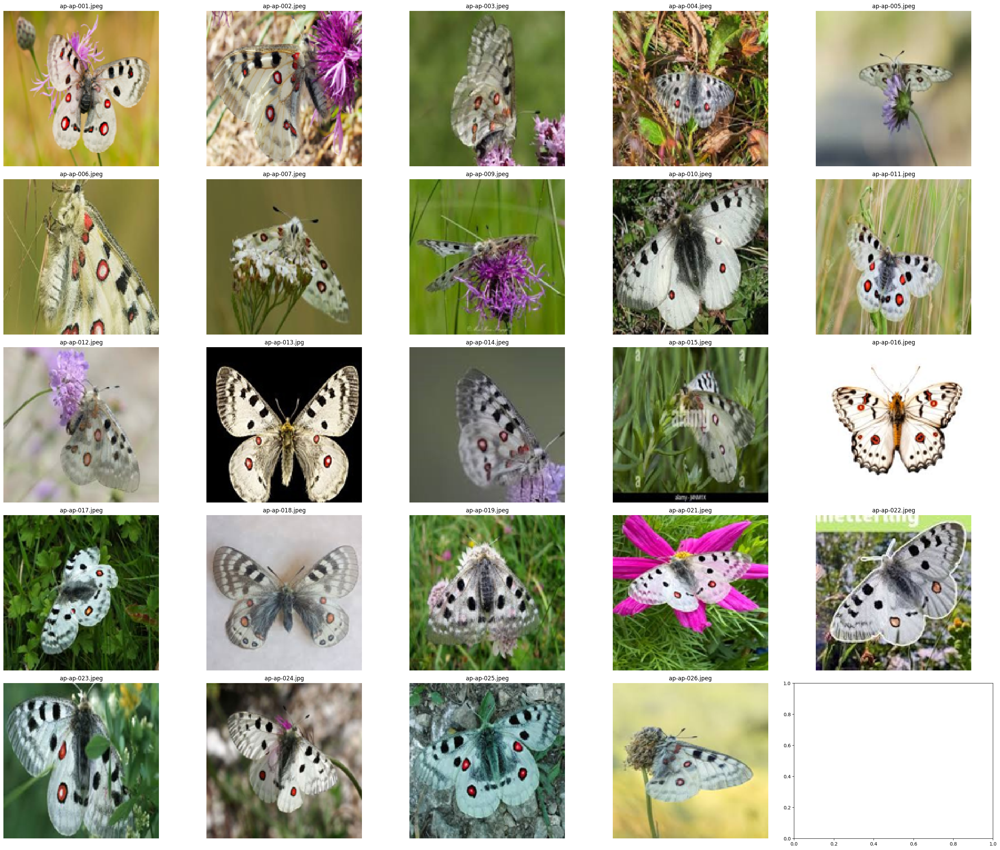

Number of images displayed: prvních 24
['/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-001.webp', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-002.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-003.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-004.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-005.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-006.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-007.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-008.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-009.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-010.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-011.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/bl/bl-013.jpg', '/content/Dat

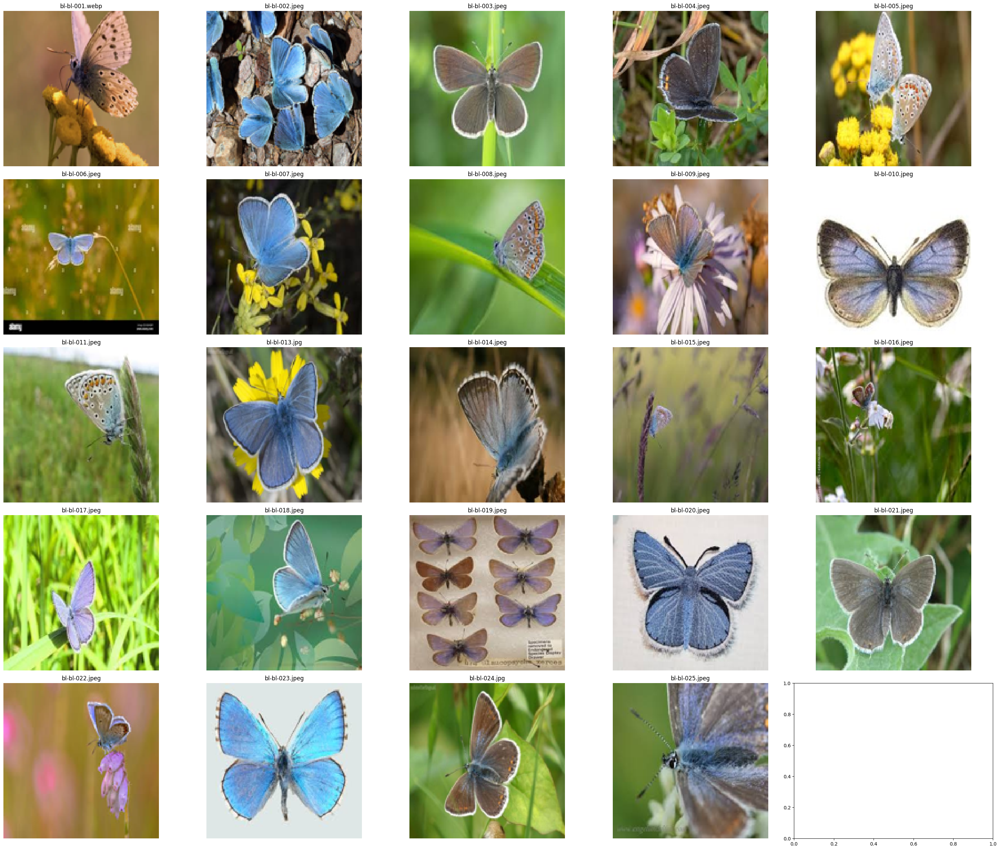

Number of images displayed: prvních 24
['/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-001.jpg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-002.jpg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-003.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-004.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-005.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-006.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-007.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-008.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-009.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-010.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-011.jpeg', '/content/Datasets/Butterflies_Austria_5_20/butterflies/train/cf/cf-012.jpeg', '/content/Data

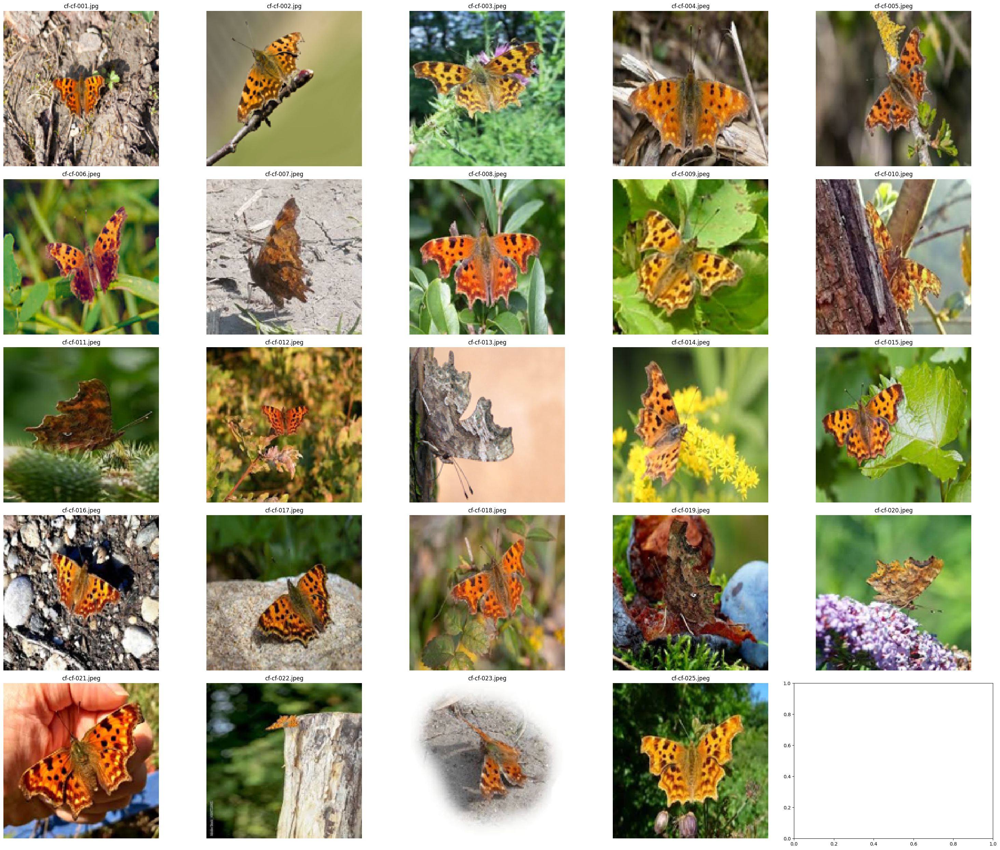

In [ ]:
# Zobrazení prvních 25 obrázků prvního druhu

train_folders = os.listdir(train_dir)
train_folders.sort()
train_images_displayed = 0
train_image_paths = []
train_image_titles = []
for folder in train_folders:
    train_image_paths = []
    train_image_titles = []
    train_images_displayed = 0
    folder_path = os.path.join(train_dir, folder)
    image_files = os.listdir(folder_path)
    image_files.sort()
    for i, image_file in enumerate(image_files[:25]):
        image_path = os.path.join(folder_path, image_file)
        train_image_paths.append(image_path)
        train_image_titles.append(f"{folder}-{image_file}")
        train_images_displayed += 1

    print(f"Number of images displayed: prvních {train_images_displayed}")
    display_images_with_titles(train_image_paths, train_image_titles)


 Images of each Folder of Training Data::


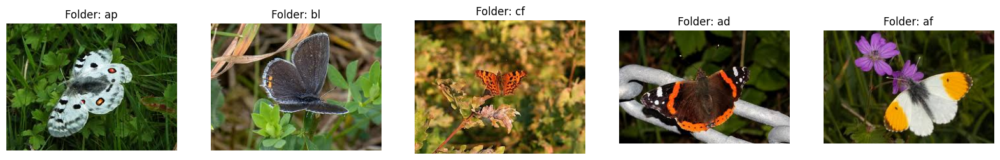


 Images of each folder of Validation Data::


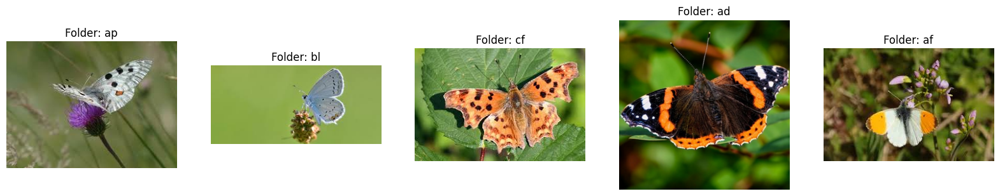

In [ ]:
# Function to print bold headings
def print_bold_heading(heading):
    print(f"\n \033[1m{heading}:\033[0m")

# Display 10 images from each folder in the train folder
print_bold_heading("Images of each Folder of Training Data:")
train_folders = os.listdir(train_dir)
fig, ax = plt.subplots(1, 5, figsize=(20, 10))
for i, folder in enumerate(train_folders[:10]):
    folder_path = os.path.join(train_dir, folder)
    image_files = os.listdir(folder_path)
    for j, image_file in enumerate(image_files[:1]):
        image_path = os.path.join(folder_path, image_file)
        ax[i%5].imshow(Image.open(image_path))
        ax[i%5].axis('off')
        ax[i%5].set_title(f"Folder: {folder}")
plt.show()

# Display 10 images from each folder in the validation folder
print_bold_heading("Images of each folder of Validation Data:")
val_folders = os.listdir(val_dir)
fig, ax = plt.subplots(1, 5, figsize=(20, 10))
for i, folder in enumerate(val_folders[:10]):
    folder_path = os.path.join(val_dir, folder)
    image_files = os.listdir(folder_path)
    for j, image_file in enumerate(image_files[:1]):
        image_path = os.path.join(folder_path, image_file)
        ax[i%5].imshow(Image.open(image_path))
        ax[i%5].axis('off')
        ax[i%5].set_title(f"Folder: {folder}")
plt.show()

Number of Species: 20


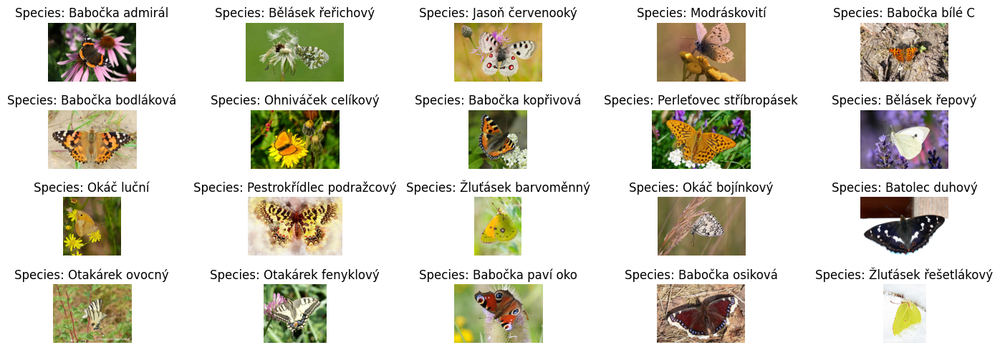

In [91]:
# Print first image from each folder in train_folders with Species name

train_folders = os.listdir(train_dir)
train_folders.sort()
train_images_displayed = 0
train_image_paths = []
train_image_titles = []
for folder in train_folders:
    folder_path = os.path.join(train_dir, folder)
    image_files = os.listdir(folder_path)
    if image_files:
        image_path = os.path.join(folder_path, image_files[0])
        train_image_paths.append(image_path)
        train_image_titles.append(f"Species: {dfcz[dfcz['abk'] == folder]['cname'].values[0]}")
        train_images_displayed += 1

print(f"Number of Species: {train_images_displayed}")
display_images_with_titles_II(train_image_paths, train_image_titles)

## Model

In [93]:
IM_SIZE = 224

In [96]:
# Load species CSV
df = dfcz
dfcz.head()

,num,abk,gname,latin,cname
0,1,ad,Admiral,Vanessa Atalanta,Babočka admirál
1,2,ap,Apollo,Parnassius Apollo,Jasoň červenooký
2,3,af,Aurora,Anthocharis Cardamines,Bělásek řeřichový
3,4,bl,Blaeuling,Lycaenidae,Modráskovití
4,5,cf,C-Falter,Polygonia C-album,Babočka bílé C


In [97]:
# Define image generators for training and validation
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(IM_SIZE, IM_SIZE),
        batch_size=64,
        class_mode='categorical')

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_directory(
        val_dir,
        target_size=(IM_SIZE, IM_SIZE),
        batch_size=64,
        class_mode='categorical')

Found 6252 images belonging to 20 classes.
Found 257 images belonging to 20 classes.


In [98]:
# Load pre-trained VGG16 model without the top (fully connected) layers
#base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IM_SIZE, IM_SIZE, 3))
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IM_SIZE, IM_SIZE, 3))

9406464/9406464 [==============================] - 1s 0us/step


In [99]:
# freeze base model
base_model.trainable = False

# Build the model on top of the base model
model = Sequential([
    base_model,
    Flatten(),
    Dense(512, activation='relu'),
    Dense(20, activation='softmax')
])

# Compile the model with Adam optimizer
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Compute class weights to handle class imbalance
class_weights = df['latin'].value_counts().sort_index().to_dict()

# Define early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)


In [ ]:
# Train the model with early stopping
history = model.fit(
      train_generator,
      #steps_per_epoch=int(train_generator.samples/train_generator.batch_size),
      epochs=5,
      validation_data=val_generator,
      #validation_steps=int(val_generator.samples/val_generator.batch_size),
      callbacks=[early_stopping]
      #,class_weight=class_weights
      )

# Evaluate the model
loss, accuracy = model.evaluate(val_generator)
print("Validation Accuracy:", accuracy)

In [37]:
def plot_history(history):
    # plot the Loss curve(s)
    plt.figure(figsize=[8,6])

    plt.plot(history.history['loss'],'r',linewidth=3.0)
    plt.plot(history.history['val_loss'],'b',linewidth=3.0)

    plt.legend(['Training loss', 'Validation Loss'],fontsize=18)
    plt.xlabel('Epochs ',fontsize=16)
    plt.ylabel('Loss',fontsize=16)
    plt.title('Loss Curves',fontsize=16)
    plt.show()

    # plot the Accuracy curve(s)
    plt.figure(figsize=[8,6])

    plt.plot(history.history['accuracy'], 'r', linewidth=3.0)
    plt.plot(history.history['val_accuracy'], 'b',linewidth=3.0)

    plt.legend(['Training Accuracy', 'Validation Accuracy'],fontsize=18)
    plt.xlabel('Epochs ',fontsize=16)
    plt.ylabel('Accuracy',fontsize=16)
    plt.title('Accuracy Curves',fontsize=16)
    plt.show()

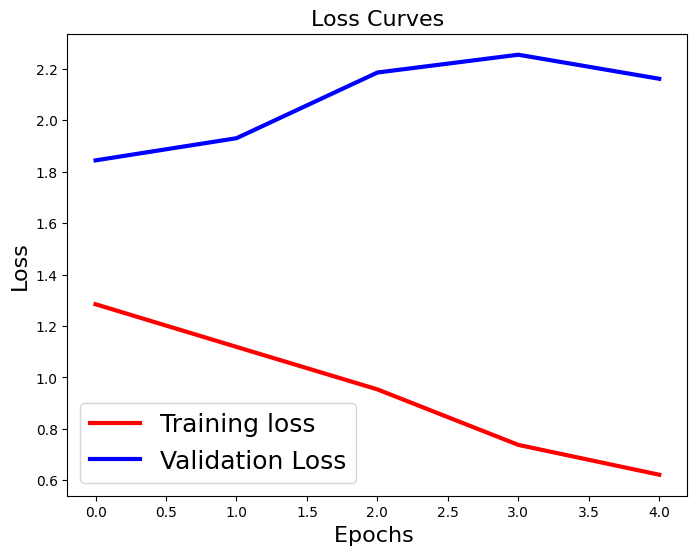

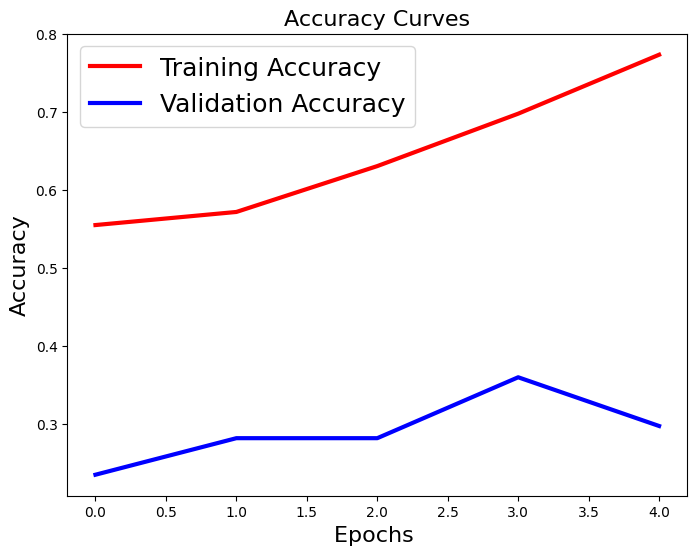

In [ ]:
plot_history(history)

### Save model during the training


In [39]:
model.save("/content/Datasets/Butterflies_MobileNetV2.keras")

In [32]:
model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 512)                 │      32,113,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 20)                  │          10,260 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 103,066,750 (393.17 MB)

 Trainable params: 34,342,676 (131.01 MB)

 Non-trainable params: 38,720 (151.25 KB)

 Optimizer params: 68,685,354 (262.01 MB)

In [ ]:
model.predict()